In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sampling import sample_sphere, sample_ball
from helper import merge_domains_nd, update_neighbors, get_neighbors, dist_to_edge, get_average_heat, dist_to_obstacle
from shapes import EgoSphere
from path import filter_paths, check_path, check_intercept
from animate import animate_2d


VIEW_RANGE = 100
MOVEMENT_RANGE= 5
EPSILON = 0.4999999

In [ ]:
def load_ndarray(name: str) -> np.ndarray:
    """Companion loader that reconstructs the array from the saved file."""
    with open(name, "r") as f:
        n     = int(f.readline().strip())
        shape = tuple(int(s) for s in f.readline().strip().split())
        flat  = list(map(float, f.readline().strip().split()))

    return np.array(flat).reshape(shape)

In [ ]:
def wos_walk_altered_g(radius_g, ego_sphere, distance_field, min_corner_field, goal, start, overall_domain, min_corner, curr_rec):
    if curr_rec == 1000:
        return 0, []
    adjusted_start = start-min_corner
    dist_g = np.linalg.norm(start-goal)
    if dist_g < radius_g:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    dist_b = dist_to_edge(adjusted_start, overall_domain)
    obstacle_hit = False
    dist_o = dist_to_obstacle(distance_field, min_corner_field, start)
    if dist_o == None:
        return 0, []
    if dist_o < dist_b:
        dist_b = dist_o-5
        obstacle_hit = True

    if obstacle_hit and dist_b <= 0:
        return None, []
    
    if (not obstacle_hit and dist_b<EPSILON) or dist_to_obstacle(domain, min_corner, start)<0:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    point = None
    while point == None:
        v = sample_sphere(ego_sphere.dim, dist_b, start)
        point, next_steps = wos_walk_altered_g(radius_g, ego_sphere, distance_field, min_corner_field, goal, v, overall_domain, min_corner, curr_rec+1)

    update_neighbors(overall_domain, adjusted_start, point)
    if point == 0:
        return 0, []
    next_steps.append(start)
    return point, next_steps

In [ ]:
def WoS_altered_g(ego_sphere, distance_field, min_corner_field, goal, start, radius, n_walks, overall_domain, min_corner):
    dim = len(start)
    max_heat = -1
    final_path = [start.copy()]
    radius_g = distance_field[tuple(np.round(goal-min_corner_field).astype(int))]
    for walk in range(n_walks):
        first_step = sample_ball(dim, radius-5, start)
        heat, path = wos_walk_altered_g(radius_g, ego_sphere,  distance_field, min_corner_field, goal, first_step, overall_domain, min_corner, 0)
        if len(path)>0:
            if heat > max_heat:
                max_heat = heat
                path.append(start)
                final_path = path
            elif heat == max_heat:
                if len(path) < len(final_path):
                    max_heat = heat
                    path.append(start)
                    final_path = path
                
    return overall_domain, final_path

In [ ]:
def ego_centric_wos_mapping(path, domain, min_corner, start, goal, distance_field, min_corner_field, direction, n_walks=1000):
    ego_sphere = EgoSphere(VIEW_RANGE, start, goal)
    radius = min(VIEW_RANGE, dist_to_obstacle(distance_field, min_corner_field, start))
    domain, new_path = WoS_altered_g(ego_sphere, distance_field, min_corner_field, goal, start, radius, n_walks, domain, min_corner)
    
    if len(new_path)>1 and check_path(path, new_path, domain, min_corner):
        new_path = filter_paths(new_path, distance_field, min_corner_field)
        path = new_path

    if len(path) < 2:
        return domain, path[0], path
    
    path[0] = path[0] + (path[1] - path[0])/2
    return domain, path[0], path
    




In [ ]:
def path_mapping(start, goal, distance_field, min_corner_field, direction=None, n_walks=1000):
    dim = len(start)
    dist_g = np.ceil(np.linalg.norm(start-goal)).astype(int)
    path = [start.copy()]
    krr = [start.copy()]
    heatmaps = []
    domain = np.zeros(shape=[1]*dim)
    min_corner = start
    min_corners = []
    domain_size = VIEW_RANGE * 2 + 1
    count = 0

    while dist_g>distance_field[tuple(np.round(goal-min_corner_field).astype(int))]:
        print(start)
        count+=1
        new_min_corner = start - np.array([VIEW_RANGE]*dim)
        domain, min_corner = merge_domains_nd(domain, min_corner, new_min_corner, tuple([domain_size]*dim))

        solved_domain, start, krr = ego_centric_wos_mapping(krr, domain, min_corner, start, goal, distance_field, min_corner_field, direction, n_walks)
        path.append(start.copy())
        dist_g = np.linalg.norm(start-goal)
        if count%1 == 0:
            temp = np.array(path)
            hi = np.array(krr)
            #plot_heatmap_3d(solved_domain, temp-min_corner)
            plt.imshow(solved_domain, cmap='inferno')
            plt.plot(*(temp-min_corner).T[::-1], 'w-')
            plt.show()
            print(start)
        '''threshold = np.quantile(solved_domain, 0.999)
        mask = solved_domain >= threshold
        points = solved_domain.copy()
        points[mask] = 0
        plt.imshow(solved_domain, cmap='inferno')
        plt.plot(*(temp-min_corner).T[::-1], 'w-')
        plt.show()'''
        
        heatmaps.append(solved_domain)
        min_corners.append(min_corner)

    #path.append(goal)

    return heatmaps, path, min_corners


In [51]:
#working with velocity
def WoS_altered_g(velocity, ego_sphere, distance_field, min_corner_field, goal, start, radius, n_walks, overall_domain, min_corner):
    dim = len(start)
    max_heat = 0
    final_path = [start.copy()]
    radius_g = distance_field[tuple(np.round(goal-min_corner_field).astype(int))]
    heat_sources = heat_velcoity_map(start,)
    for walk in range(n_walks):
        first_step = sample_ball(dim, radius, start)
        heat, path = wos_walk_altered_g(velocity, radius_g, ego_sphere,  distance_field, min_corner_field, goal, first_step, overall_domain, min_corner, 0)
        if len(path)>0:
            if heat > max_heat:
                max_heat = heat
                path.append(start)
                final_path = path
            elif heat == max_heat:
                if len(path) < len(final_path):
                    max_heat = heat
                    path.append(start)
                    final_path = path
                
    return overall_domain, final_path

def wos_walk_altered_g(velocity, radius_g, ego_sphere, distance_field, min_corner_field, goal, start, overall_domain, min_corner, curr_rec):
    if curr_rec == 1000:
        return 0, []
    adjusted_start = start-min_corner
    dist_g = np.linalg.norm(start-goal)
    if dist_g < radius_g:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    dist_b = dist_to_edge(adjusted_start, overall_domain)
    obstacle_hit = False
    dist_o = get_neighbors(distance_field, start-min_corner_field)
    if len(dist_o)>0:
        for i in dist_o:
            if i[1] <= dist_b:
                dist_b = i[1]
                obstacle_hit = True
    else:
        return 0,[]

    if obstacle_hit and dist_b < 5:
        return None, []
    
    if dist_b<EPSILON:
        point = (ego_sphere.g(dist_g)*100000000)
        update_neighbors(overall_domain, adjusted_start, point)
        return point, [start]
    
    point = None
    while point == None:
        v = sample_sphere(ego_sphere.dim, dist_b, start)
        point, next_steps = wos_walk_altered_g(radius_g, ego_sphere, distance_field, min_corner_field, goal, v, overall_domain, min_corner, curr_rec+1)

    if 

    update_neighbors(overall_domain, adjusted_start, point)
    if point == 0:
        return 0, []
    next_steps.append(start)
    return point, next_steps

SyntaxError: invalid syntax (524664648.py, line 58)

In [7]:
start = np.array([750.0, 50.0])
goal = np.array([250.0, 950.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/forest_2d')
min_corner_field = np.array([0,0])
direction = np.array([0, -1])

In [ ]:
start = np.array([250.0, 450.0])
goal = np.array([250.0, 800.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/box_2d')
min_corner_field = np.array([0,250])
direction = np.array([0, -1])

In [ ]:
start = np.array([450, 400.0, 450.0])
goal = np.array([450, 540.0, 450.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/obstacles_3d')
min_corner_field = np.array([350,350,350])
direction = np.array([0, -1])

In [ ]:
start = np.array([450, 400.0])
goal = np.array([450, 540.0])
dim = len(start)
distance_field = load_ndarray('/Users/TWengChu/Desktop/wos_v2/obstacle_fields/obstacles_2d')
min_corner_field = np.array([350,350])
direction = np.array([0, -1])

[750.  50.]


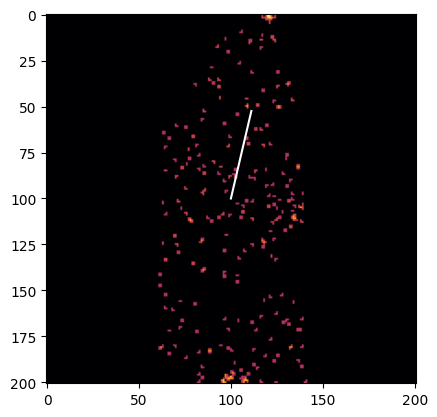

[702.43804952  61.11849239]
[702.43804952  61.11849239]


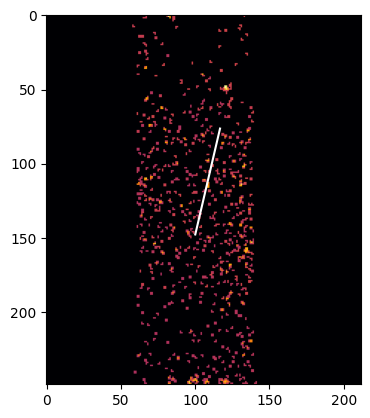

[678.65707428  66.67773858]
[678.65707428  66.67773858]


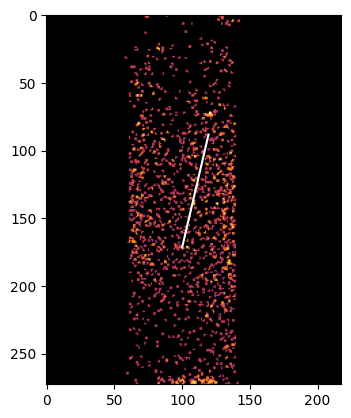

[666.76658666  69.45736168]
[666.76658666  69.45736168]


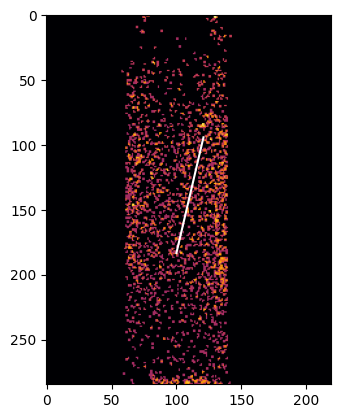

[660.82134285  70.84717323]
[660.82134285  70.84717323]


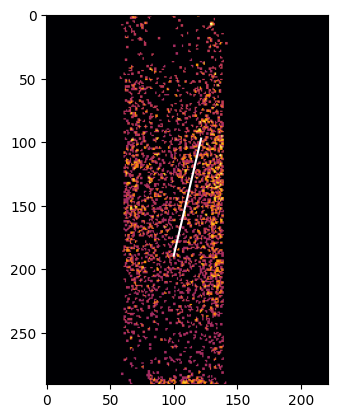

[657.84872094  71.542079  ]
[657.84872094  71.542079  ]


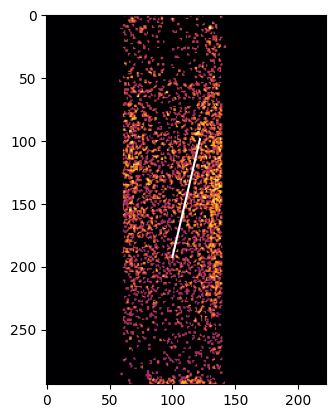

[656.36240999  71.88953189]
[656.36240999  71.88953189]


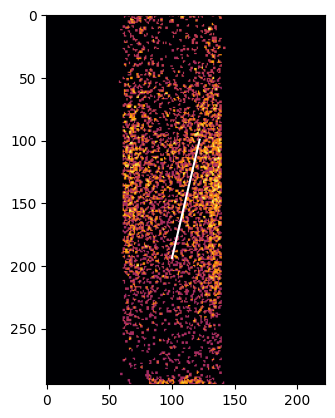

[655.61925452  72.06325833]
[655.61925452  72.06325833]


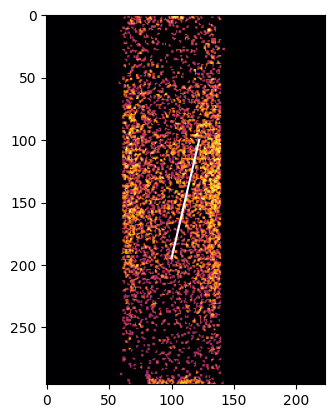

[655.24767678  72.15012155]
[655.24767678  72.15012155]


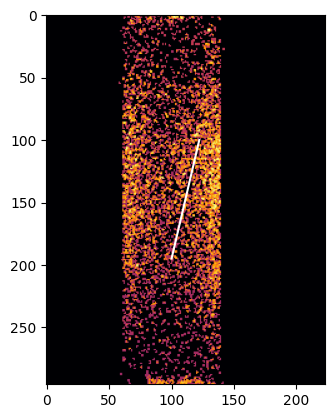

[655.06188791  72.19355316]
[655.06188791  72.19355316]


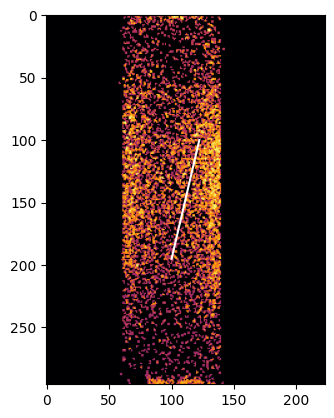

[654.96899347  72.21526897]
[654.96899347  72.21526897]


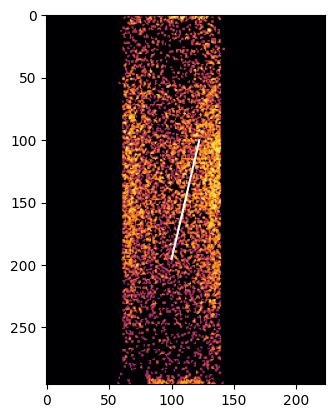

[654.92254626  72.22612687]
[654.92254626  72.22612687]


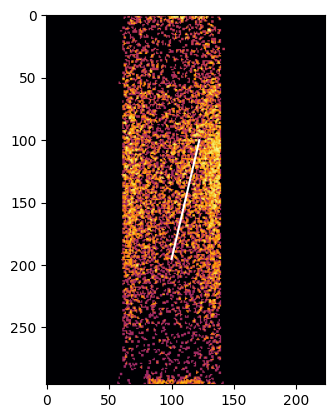

[654.89932265  72.23155582]
[654.89932265  72.23155582]


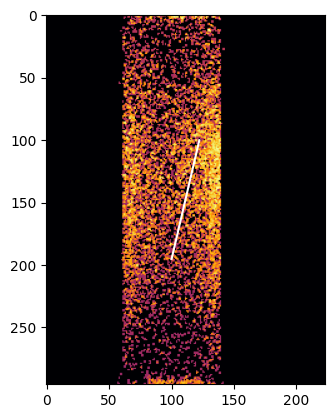

[654.88771084  72.2342703 ]
[654.88771084  72.2342703 ]


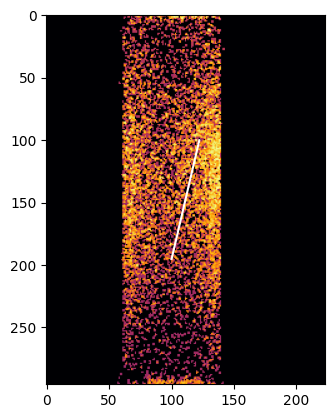

[654.88190494  72.23562754]
[654.88190494  72.23562754]


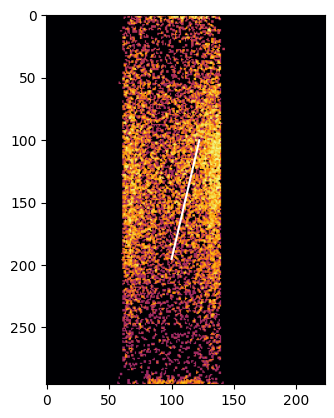

[654.87900199  72.23630616]
[654.87900199  72.23630616]


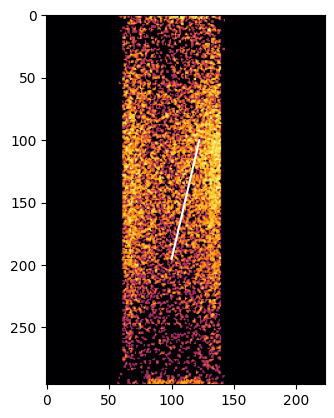

[654.87755051  72.23664547]
[654.87755051  72.23664547]


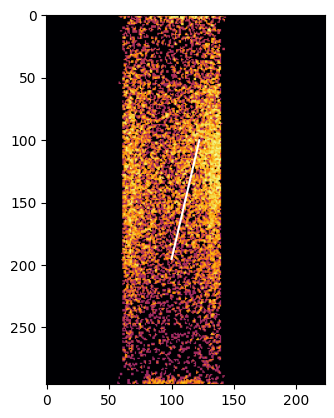

[654.87682478  72.23681512]
[654.87682478  72.23681512]


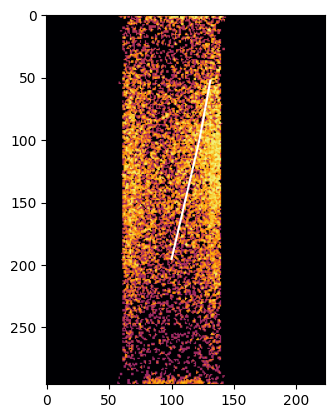

[607.33516877  81.03861969]
[607.33516877  81.03861969]


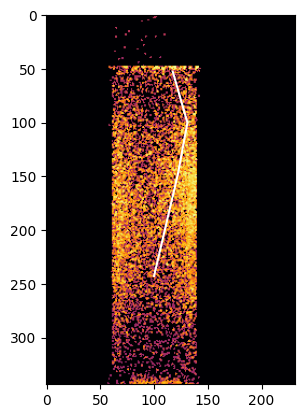

[559.82367533  67.36329712]
[559.82367533  67.36329712]


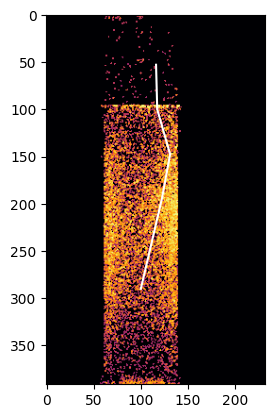

[512.4375841  66.1282127]
[512.4375841  66.1282127]


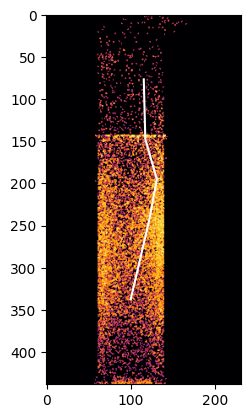

[488.74453849  65.5106705 ]
[488.74453849  65.5106705 ]


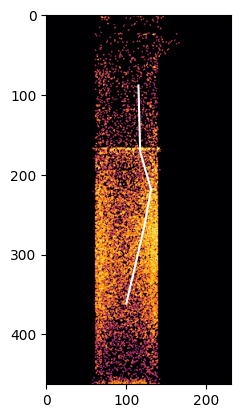

[476.89801568  65.20189939]
[476.89801568  65.20189939]


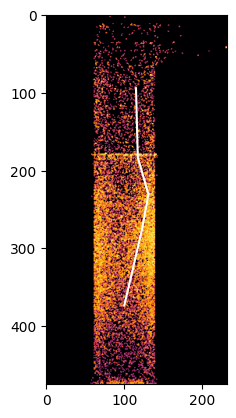

[470.97475428  65.04751384]
[470.97475428  65.04751384]


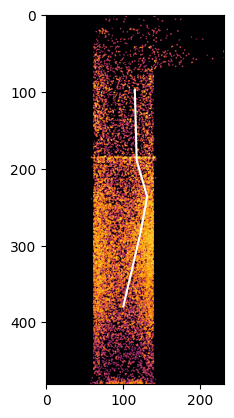

[468.01312358  64.97032107]
[468.01312358  64.97032107]


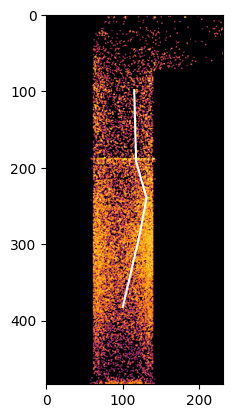

[466.53230823  64.93172468]
[466.53230823  64.93172468]


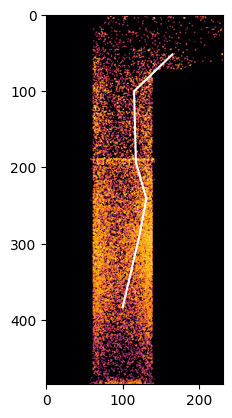

[418.19554391 115.16514176]
[418.19554391 115.16514176]


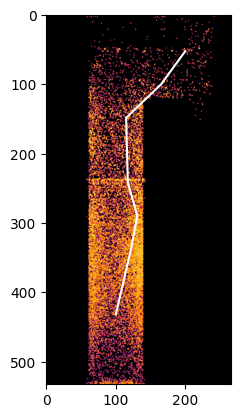

[370.33906686 150.20996925]
[370.33906686 150.20996925]


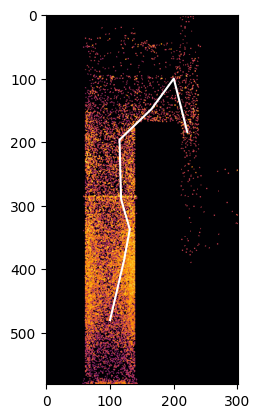

[454.33020331 171.4173643 ]
[454.33020331 171.4173643 ]


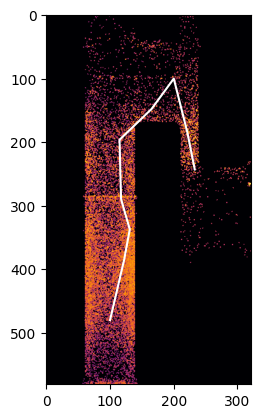

[513.13347328 183.21030058]
[513.13347328 183.21030058]


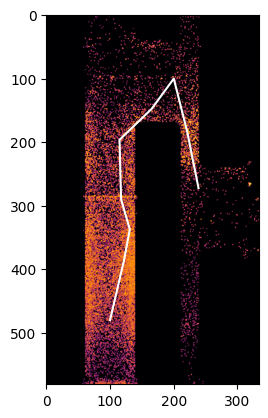

[542.53510827 189.10676872]
[542.53510827 189.10676872]


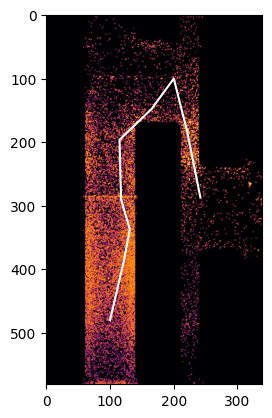

[557.23592576 192.05500278]
[557.23592576 192.05500278]


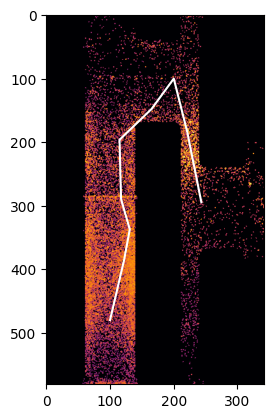

[564.58633451 193.52911982]
[564.58633451 193.52911982]


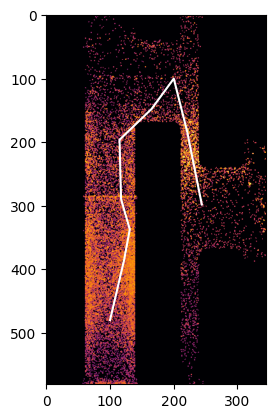

[568.26153888 194.26617834]
[568.26153888 194.26617834]


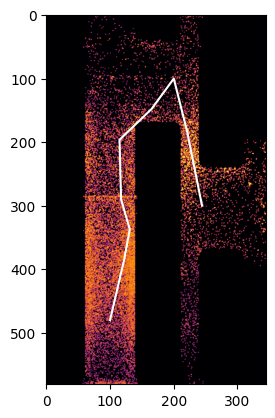

[570.09914107 194.63470759]
[570.09914107 194.63470759]


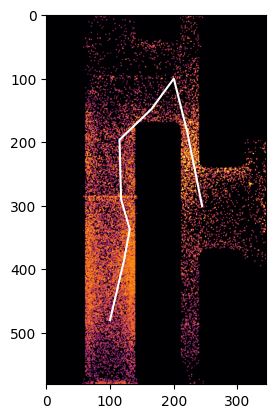

[571.01794216 194.81897222]
[571.01794216 194.81897222]


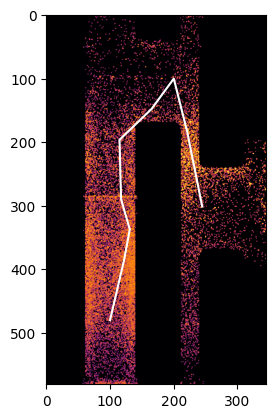

[571.47734271 194.91110454]
[571.47734271 194.91110454]


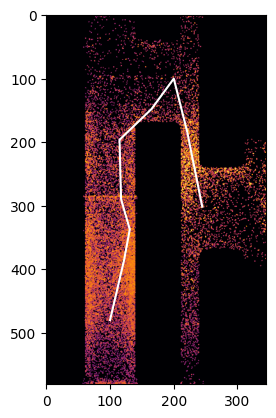

[571.70704298 194.9571707 ]
[571.70704298 194.9571707 ]


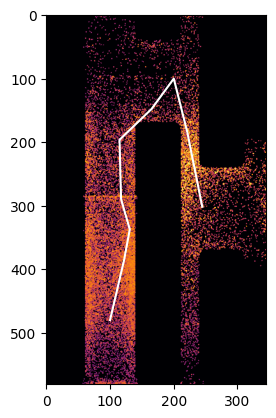

[571.82189312 194.98020377]
[571.82189312 194.98020377]


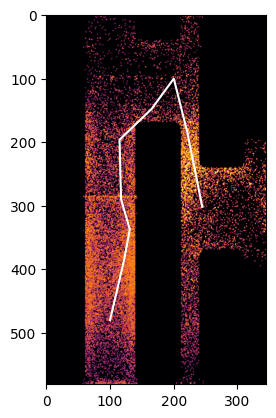

[571.87931818 194.99172031]
[571.87931818 194.99172031]


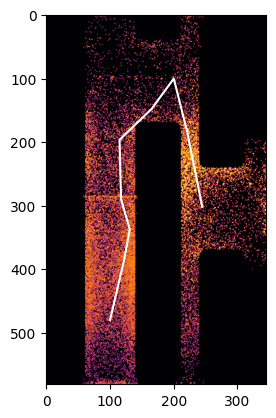

[571.90803072 194.99747858]
[571.90803072 194.99747858]


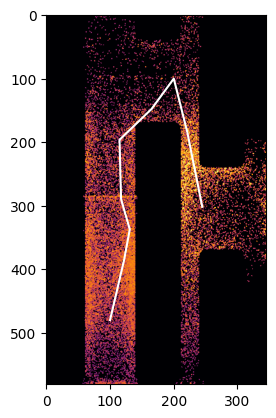

[571.92238699 195.00035772]
[571.92238699 195.00035772]


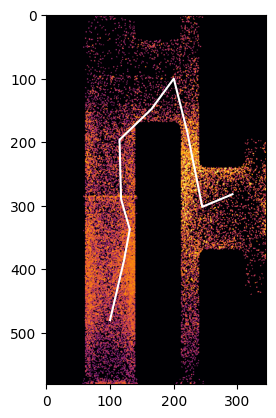

[552.08137927 242.47736442]
[552.08137927 242.47736442]


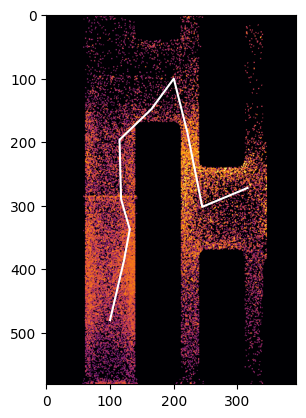

[542.16087541 266.21586777]
[542.16087541 266.21586777]


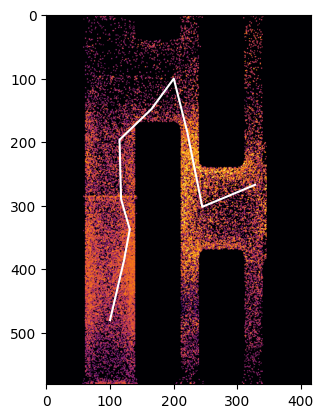

[537.20062349 278.08511945]
[537.20062349 278.08511945]


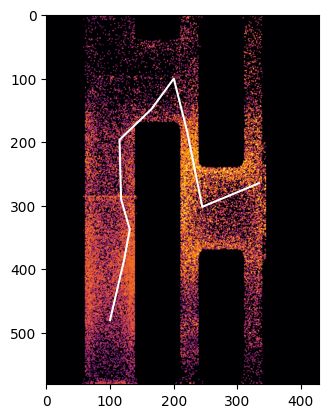

[534.72049752 284.01974529]
[534.72049752 284.01974529]


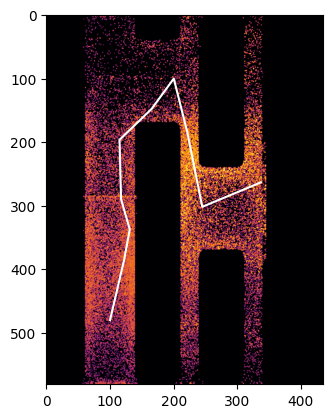

[533.48043454 286.98705821]
[533.48043454 286.98705821]


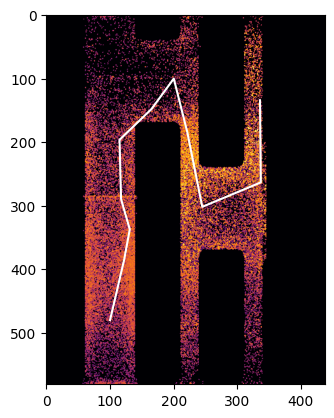

[404.42002509 285.73608504]
[404.42002509 285.73608504]


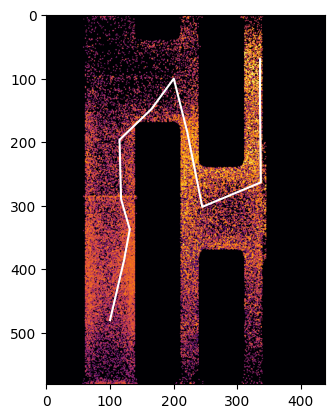

[339.96827782 285.9090894 ]
[339.96827782 285.9090894 ]


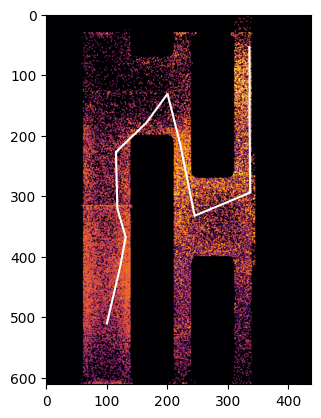

[292.69871099 285.49425224]
[292.69871099 285.49425224]


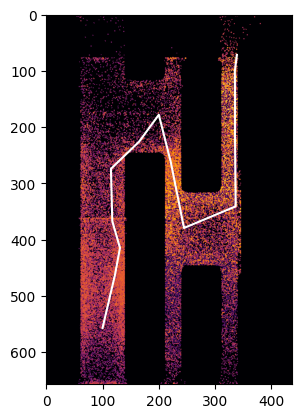

[263.77445178 289.1911684 ]
[263.77445178 289.1911684 ]


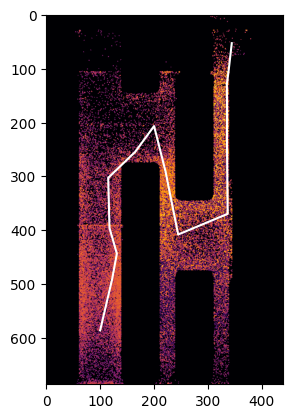

[216.28346026 294.62346796]
[216.28346026 294.62346796]


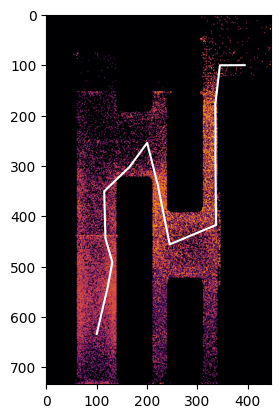

[216.05312758 343.89601561]
[216.05312758 343.89601561]


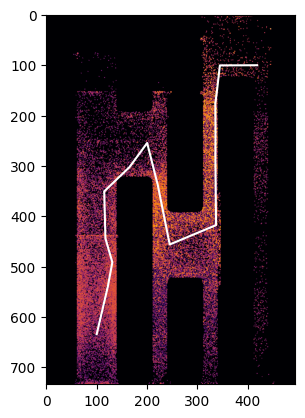

[215.93796124 368.53228944]
[215.93796124 368.53228944]


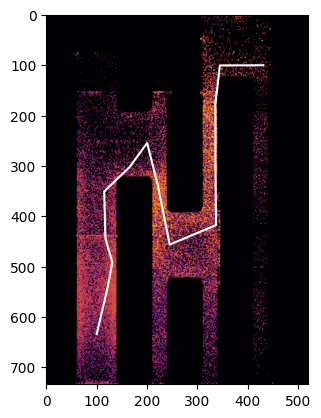

[215.88037807 380.85042636]
[215.88037807 380.85042636]


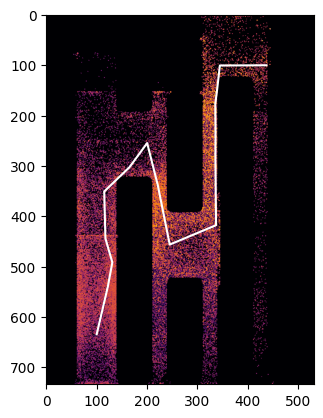

[215.85158649 387.00949481]
[215.85158649 387.00949481]


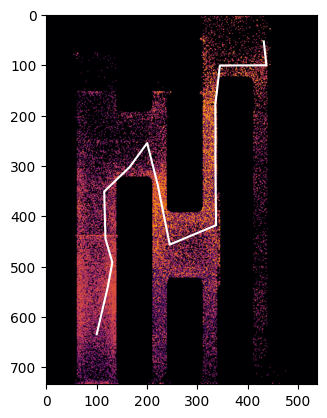

[168.56420249 381.78958985]
[168.56420249 381.78958985]


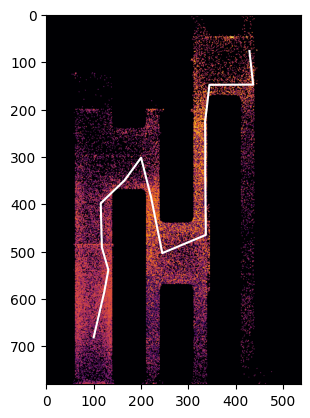

[144.92051049 379.17963738]
[144.92051049 379.17963738]


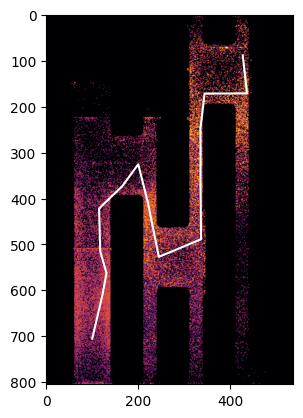

[133.09866449 377.87466114]
[133.09866449 377.87466114]


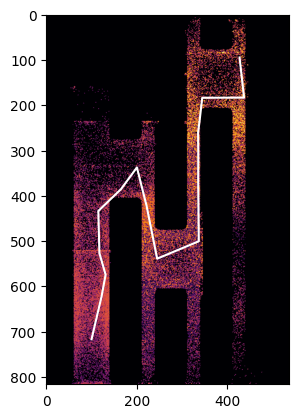

[127.18774149 377.22217302]
[127.18774149 377.22217302]


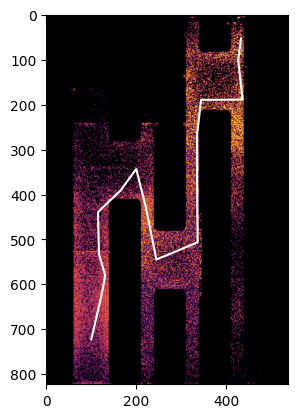

[ 79.66970958 383.63771701]
[ 79.66970958 383.63771701]


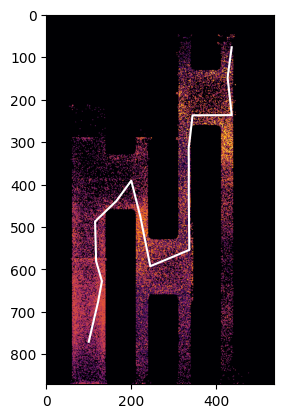

[ 55.91069363 386.845489  ]
[ 55.91069363 386.845489  ]


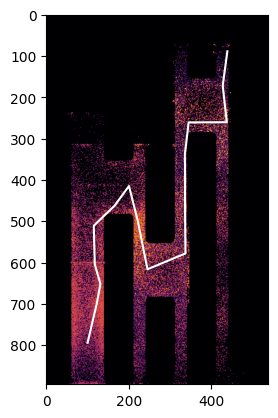

[ 44.03118566 388.449375  ]
[ 44.03118566 388.449375  ]


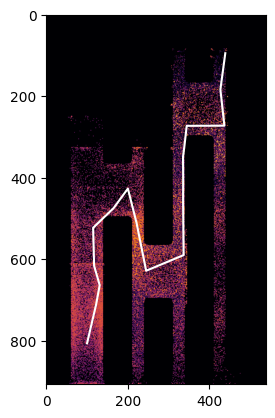

[ 38.09143167 389.251318  ]
[ 38.09143167 389.251318  ]


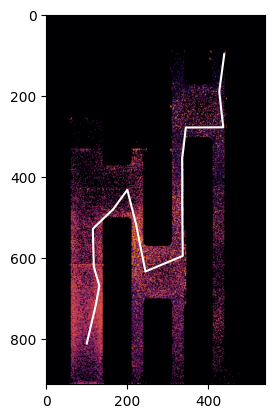

[ 35.12155467 389.6522895 ]
[ 35.12155467 389.6522895 ]


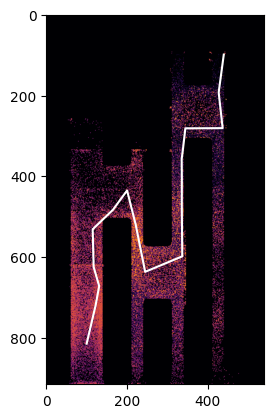

[ 33.63661618 389.85277525]
[ 33.63661618 389.85277525]


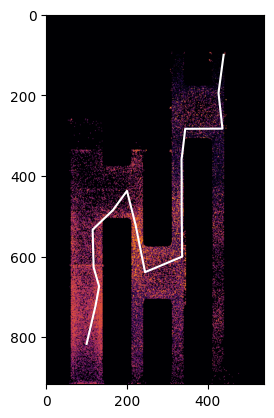

[ 32.89414693 389.95301813]
[ 32.89414693 389.95301813]


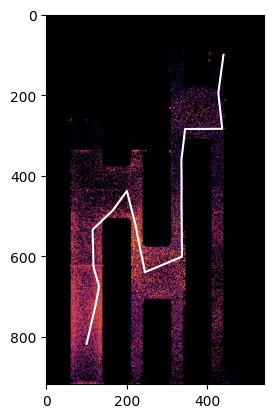

[ 32.5229123  390.00313956]
[ 32.5229123  390.00313956]


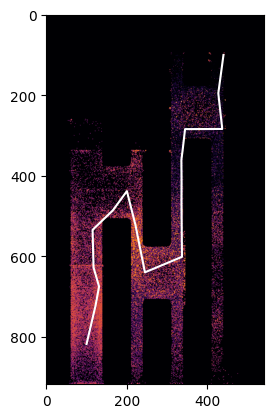

[ 32.33729499 390.02820028]
[ 32.33729499 390.02820028]


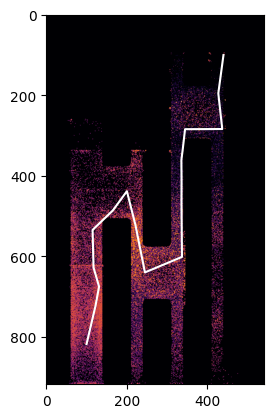

[ 32.24448634 390.04073064]
[ 32.24448634 390.04073064]


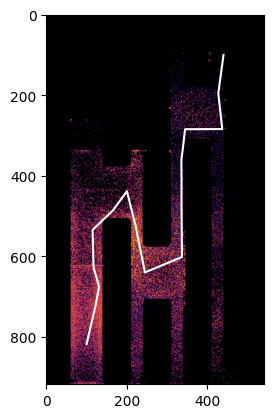

[ 32.19808201 390.04699582]
[ 32.19808201 390.04699582]


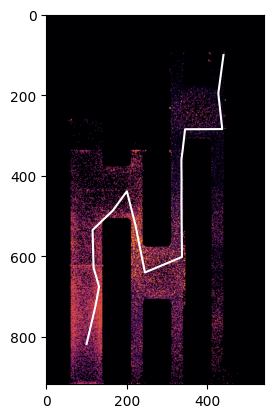

[ 32.17487984 390.05012841]
[ 32.17487984 390.05012841]


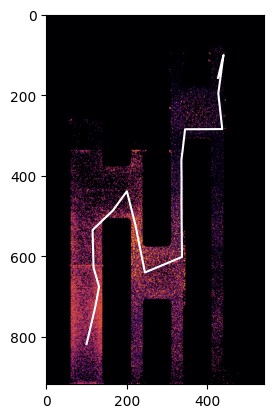

[ 88.74484123 376.48605494]
[ 88.74484123 376.48605494]


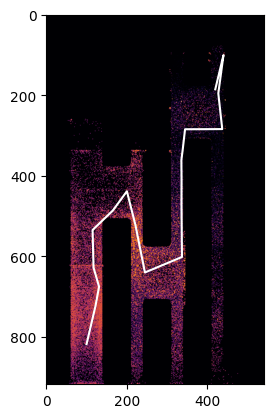

[117.02982192 369.7040182 ]
[117.02982192 369.7040182 ]


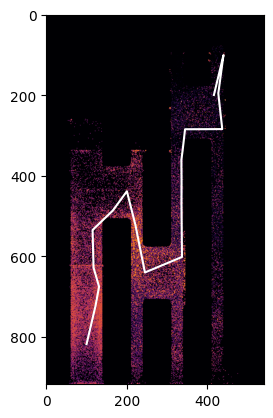

[131.17231227 366.31299984]
[131.17231227 366.31299984]


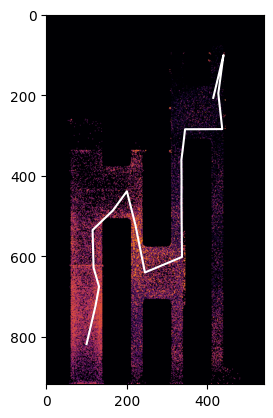

[138.24355745 364.61749065]
[138.24355745 364.61749065]


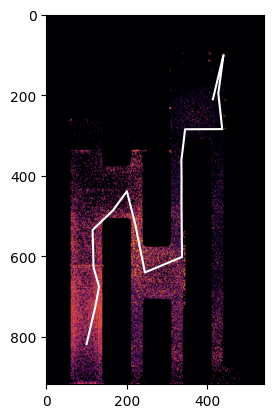

[141.77918003 363.76973606]
[141.77918003 363.76973606]


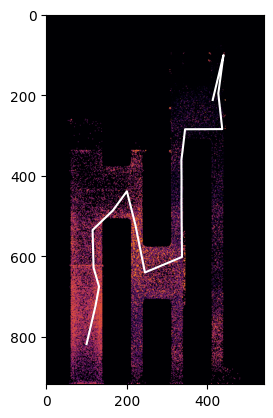

[143.54699133 363.34585876]
[143.54699133 363.34585876]


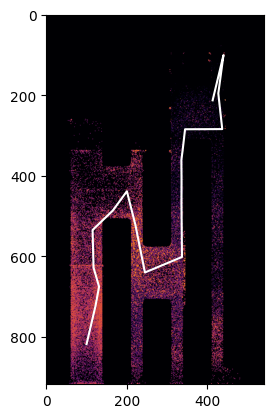

[144.43089697 363.13392012]
[144.43089697 363.13392012]


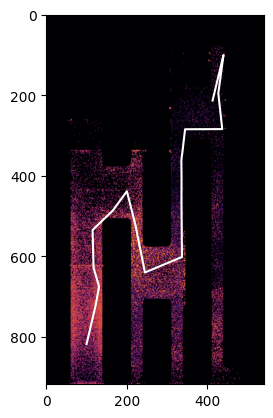

[144.8728498  363.02795079]
[144.8728498  363.02795079]


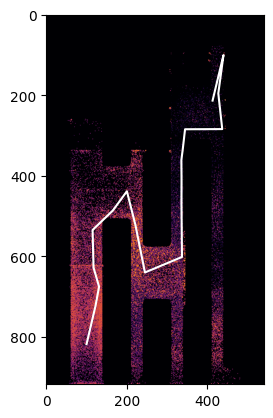

[145.09382621 362.97496613]
[145.09382621 362.97496613]


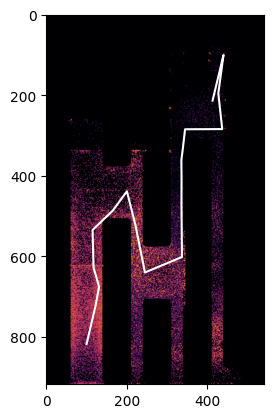

[145.20431441 362.9484738 ]
[145.20431441 362.9484738 ]


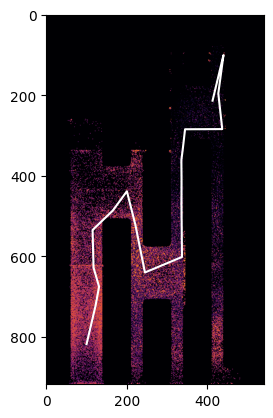

[145.25955852 362.93522763]
[145.25955852 362.93522763]


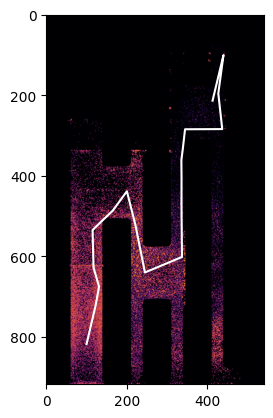

[145.28718057 362.92860455]
[145.28718057 362.92860455]


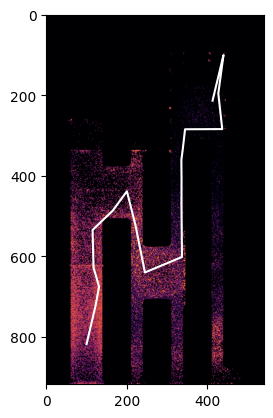

[145.30099159 362.92529301]
[145.30099159 362.92529301]


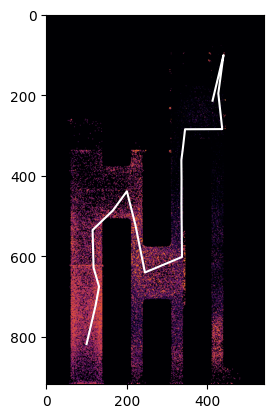

[145.30789711 362.92363724]
[145.30789711 362.92363724]


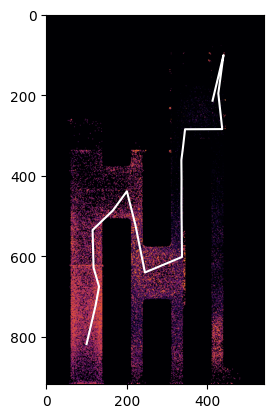

[145.31134986 362.92280935]
[145.31134986 362.92280935]


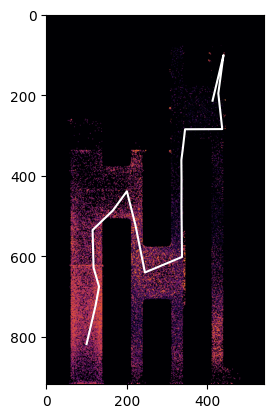

[145.31307624 362.92239541]
[145.31307624 362.92239541]


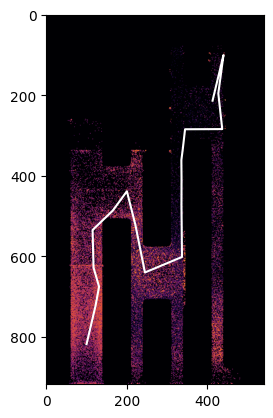

[145.31393943 362.92218844]
[145.31393943 362.92218844]


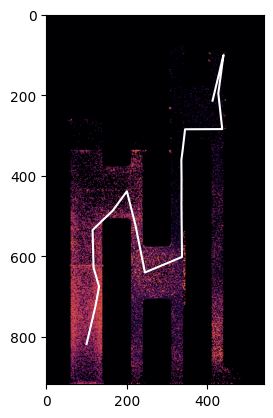

[145.31437102 362.92208495]
[145.31437102 362.92208495]


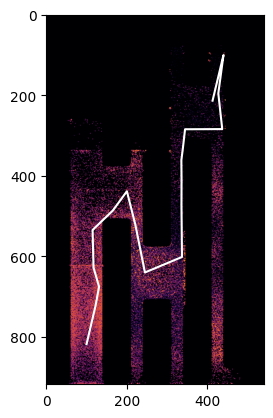

[145.31458682 362.92203321]
[145.31458682 362.92203321]


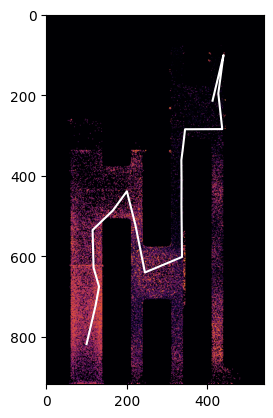

[145.31469472 362.92200734]
[145.31469472 362.92200734]


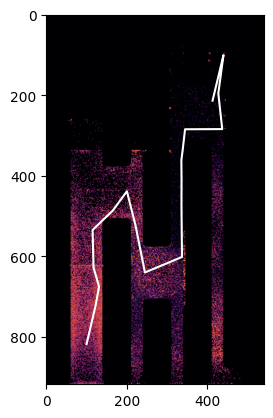

[145.31474867 362.9219944 ]
[145.31474867 362.9219944 ]


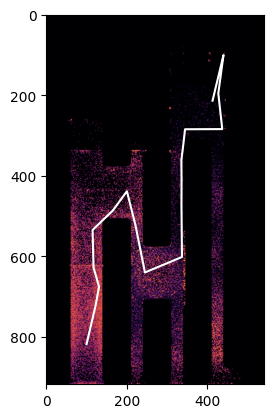

[145.31477564 362.92198794]
[145.31477564 362.92198794]


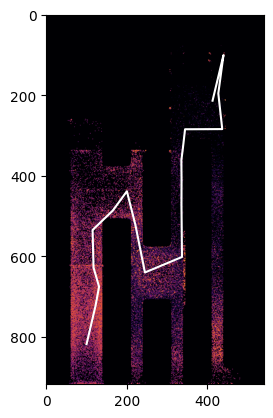

[145.31478913 362.9219847 ]
[145.31478913 362.9219847 ]


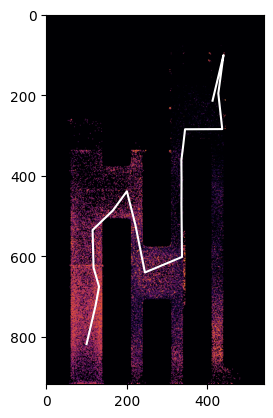

[145.31479587 362.92198309]
[145.31479587 362.92198309]


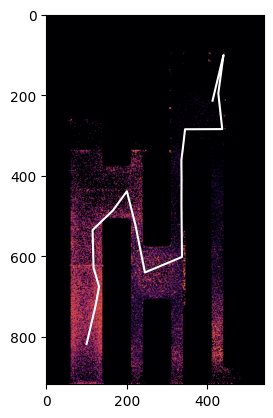

[145.31479925 362.92198228]
[145.31479925 362.92198228]


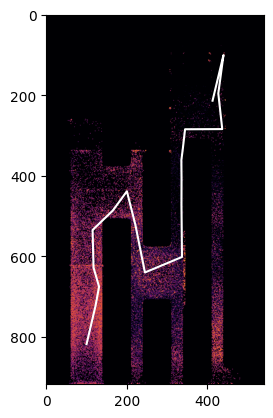

[145.31480093 362.92198187]
[145.31480093 362.92198187]


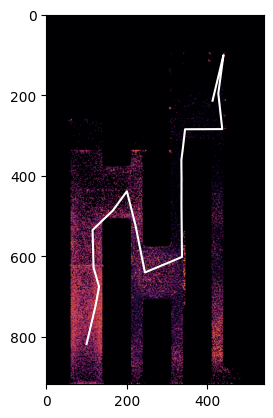

[145.31480178 362.92198167]
[145.31480178 362.92198167]


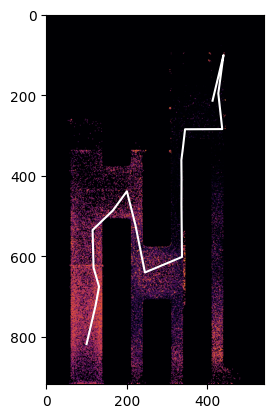

[145.3148022  362.92198157]
[145.3148022  362.92198157]


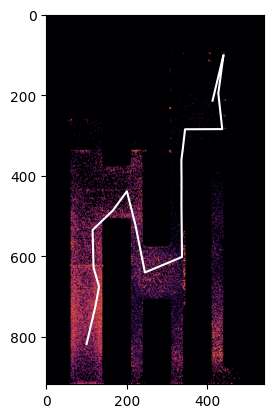

[145.31480241 362.92198152]
[145.31480241 362.92198152]


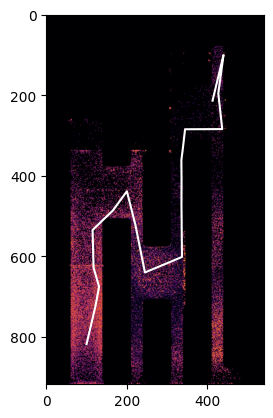

[145.31480251 362.92198149]
[145.31480251 362.92198149]


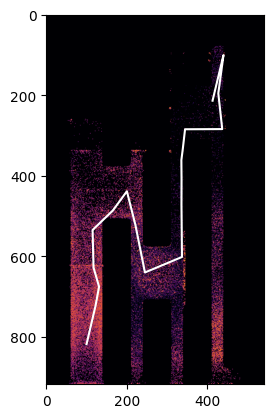

[145.31480257 362.92198148]
[145.31480257 362.92198148]


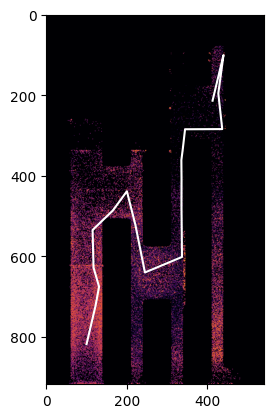

[145.31480259 362.92198147]
[145.31480259 362.92198147]


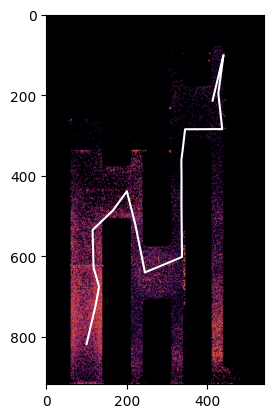

[145.31480261 362.92198147]
[145.31480261 362.92198147]


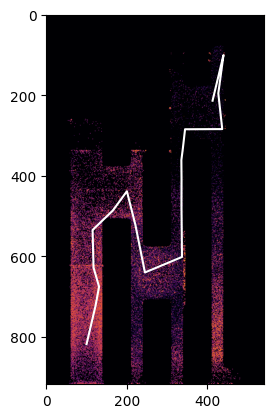

[145.31480261 362.92198147]
[145.31480261 362.92198147]


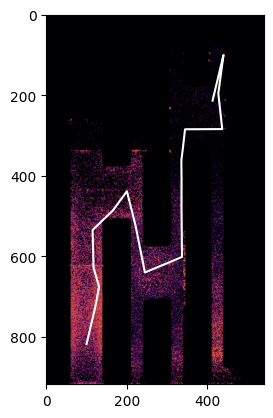

[145.31480262 362.92198147]
[145.31480262 362.92198147]


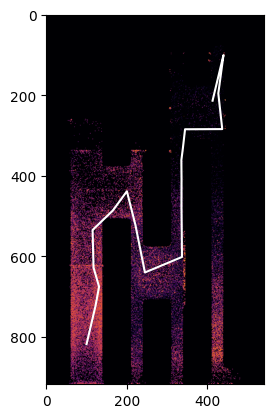

[145.31480262 362.92198147]
[145.31480262 362.92198147]


KeyboardInterrupt: 

In [ ]:
heatmaps, paths, min_corners = path_mapping(start, goal, distance_field, min_corner_field, n_walks=10)

Rendering:  24%|██▍       | 24/99 [00:30<02:33,  2.05s/it]

KeyboardInterrupt: 

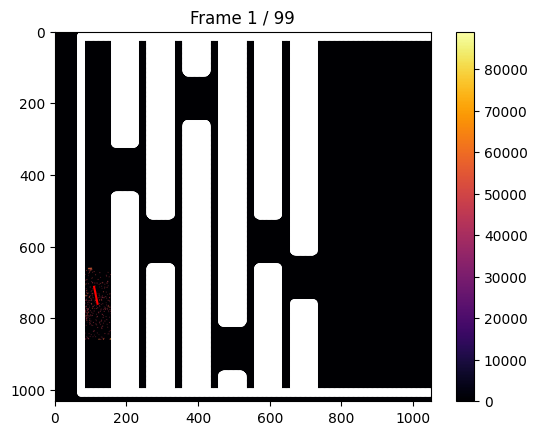

In [9]:
idx = (np.argwhere(distance_field <= 5) + min_corner_field - min_corners[-1]).astype(int) 
animate_2d(
    heatmaps,
    min_corners,
    paths,
    idx,
    output_path = "2d.gif",)

Rendering: 88it [00:18,  4.64it/s]                        


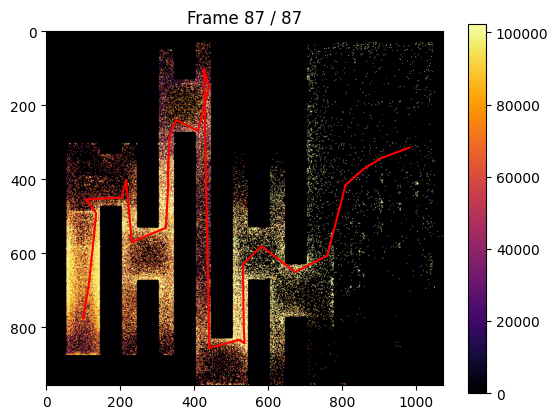

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from tqdm import tqdm

fig, ax = plt.subplots()

# Initialise image with the final merged shape so the axes are sized correctly
# from the start — this prevents imshow from locking in a stale extent on frame 0.
initial_hi, _ = merge_domains_nd(
    heatmaps[0], min_corners[0], min_corners[-1], heatmaps[-1].shape
)

im = ax.imshow(
    initial_hi,
    cmap='inferno',
    animated=True,
    extent=[0, initial_hi.shape[1], initial_hi.shape[0], 0],  # [l, r, b, t]
    origin='upper',
)
plt.colorbar(im, ax=ax)

line_object = ax.plot([], [], 'r-')[0]
pbar = tqdm(total=len(heatmaps), desc='Rendering')


def update(frame):
    hi, bye = merge_domains_nd(
        heatmaps[frame], min_corners[frame], min_corners[-1], heatmaps[-1].shape
    )

    # --- image ---
    im.set_data(hi)

    # Update the extent so every pixel in `hi` maps to exactly 1 data unit.
    # Without this the image is stretched/squashed whenever the merged shape grows.
    im.set_extent([0, hi.shape[1], hi.shape[0], 0])  # [left, right, bottom, top]

    # Keep axes limits in sync with the (possibly growing) image.
    ax.set_xlim(0, hi.shape[1])
    ax.set_ylim(hi.shape[0], 0)   # inverted: row 0 at top, matching origin='upper'

    ax.set_title(f'Frame {frame + 1} / {len(heatmaps)}')

    # --- path ---
    # Shift path coordinates into the merged array's local frame.
    # `bye` must be [row, col] order to match `paths`.
    path = np.array(paths[: frame + 2]).copy() - bye

    # imshow convention: x-axis = columns, y-axis = rows
    line_object.set_data(path[:, 1], path[:, 0])

    pbar.update(1)
    return [im, line_object]


ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(heatmaps),
    interval=500,
    blit=False,
)

ani.save('smth.gif', writer='pillow', fps=10)
pbar.close()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.cm as cm
from tqdm import tqdm


def animate_heatmap_3d(
    heatmaps: list[np.ndarray],
    min_corners: list,
    paths: list,
    clip_percentile: float = 100,
    max_alpha: float = 0.3,
    threshold: float = 0.1,
    interval: int = 500,
    fps: int = 10,
    output_path: str = "forest_3d.gif",
):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")
    max_shape = heatmaps[-1].shape

    def _set_axes():
        ax.set_xlim(0, max_shape[0])
        ax.set_ylim(0, max_shape[1])
        ax.set_zlim(0, max_shape[2])
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
    # --- helper: build scatter inputs for one frame ---
    def _prepare_frame(frame: int):
        hi, bye = merge_domains_nd(
            heatmaps[frame], min_corners[frame], min_corners[-1], heatmaps[-1].shape
        )

        data = np.clip(hi, 0, np.percentile(hi, clip_percentile))
        norm = (data - data.min()) / (data.max() - data.min() + 1e-8)

        n = data.shape
        x, y, z = np.meshgrid(np.arange(n[0]), np.arange(n[1]), np.arange(n[2]), indexing="ij")

        v = norm.flatten()
        mask = v > threshold

        colors = cm.plasma(v[mask])
        colors[:, 3] = v[mask] * max_alpha

        xs = x.flatten()[mask]
        ys = y.flatten()[mask]
        zs = z.flatten()[mask]

        # shift path into the merged frame (same logic as your 2D version)
        path = np.array(paths[: frame + 1]).copy() - bye  # shape (N, 3)

        return xs, ys, zs, colors, path.T, data.min(), data.max()

    # --- seed frame 0 so axes are sized correctly from the start ---
    xs, ys, zs, colors, path, vmin, vmax = _prepare_frame(0)

    scatter = ax.scatter(xs, ys, zs, c=colors, marker="s", s=30, linewidths=0)
    (line,) = ax.plot(*path, color="red", linewidth=1.5)

    _set_axes()
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")

    pbar = tqdm(total=len(heatmaps), desc="Rendering")

    def update(frame: int):
        ax.cla()  # 3-D scatter has no set_offsets3d that also updates colours,
                  # so clearing and redrawing is the cleanest approach

        xs, ys, zs, colors, path, vmin, vmax = _prepare_frame(frame)
        
        ax.scatter(xs, ys, zs, c=colors, marker="s", s=30, linewidths=0)
        ax.plot(*path, color="red", linewidth=1.5)
        _set_axes()  # restore limits after cla()
        ax.set_title(f"Frame {frame + 1} / {len(heatmaps)}")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")

        pbar.update(1)
        return []   # blit=False, so return value is ignored

    ani = animation.FuncAnimation(
        fig,
        update,
        frames=len(heatmaps),
        interval=interval,
        blit=False,
    )

    ani.save(output_path, writer="pillow", fps=fps)
    pbar.close()
    plt.show()

Rendering: 15it [00:13,  1.08it/s]                        


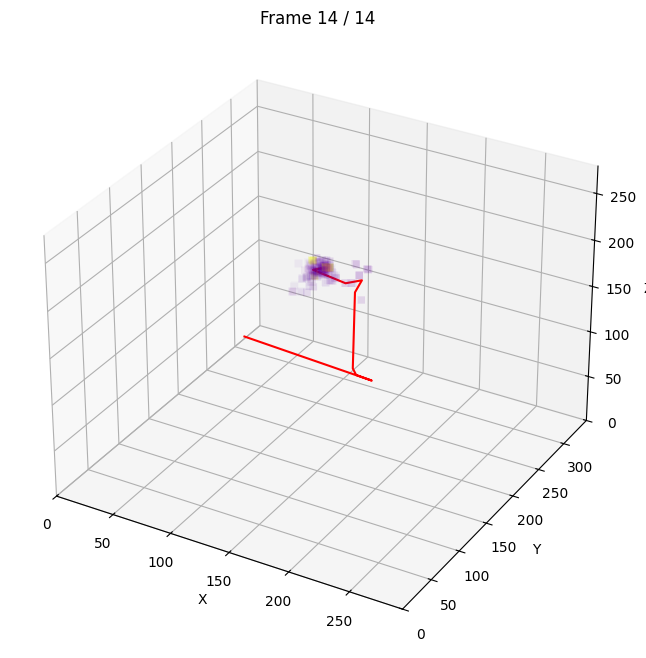

In [ ]:
animate_heatmap_3d(
    heatmaps,
    min_corners,
    paths,
    fps=2,
    output_path = "testing.gif",
)